# Background Subtraction and Source Masking

Our first step to any photometry analysis is to subtract all the things we don't care about. In this case, it's the sky background to the images and any bright stars that might skew our results. 

Our main goals here are:
1. Load and inspect the images. 
2. Correct each image for foreground Milky Way extinction. 
3. Mask bright foreground stars and nearby galaxies before estimating the background. 
4. Fit and subtract a smooth 2D background model.
5. Mask foreground stars and background point sources in the background-subtracted image.
6. Save the final masked, background-subtracted images for the next step. 

The key idea here is that we do **not** want the galaxy, bright stars, or other nearby/background galaxies to affect our estimate of the background. If they're not masked, then the background model may accidentally remove real galaxy light!

In [1]:
# Numerical tools
import numpy as np

# Plotting
import matplotlib.pyplot as plt

# FITS and WCS handling
from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales

# Astropy coordinates, units, and tables
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.table import Table, vstack, unique

# Astropy visualization helpers
from astropy.visualization import ImageNormalize, PercentileInterval, AsinhStretch

# Astroquery tools
from astroquery.ipac.irsa.irsa_dust import IrsaDust, IrsaDustClass
from astroquery.vizier import Vizier

# Photutils background tools
from photutils.background import Background2D, MedianBackground, MADStdBackgroundRMS
from astropy.stats import SigmaClip

# File/path tools
from pathlib import Path

# This makes plots a bit larger and easer to read
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['font.size'] = 12

## 1. Define the data set

First, we'll create a Table describing the images we want to use. This will keep everything nicely organized. 

Each row of our Table will contain: 
- `band`: a short name we will use internally. 
- `instrument`: the telescope/instrument.
- `wavelength_um`: approximate central wavelength in microns. We can find these at the [SVO Filter Service.](https://svo2.cab.inta-csic.es/theory/fps/index.php?mode=browse)
- `irsa_filter_name`: the name we expect to find in the IRSA Dust extinction table. 
- `filename`: the path to the FITS file.
- `hdu_index`': which FITS extension contains the science image.
- `usable`: whether we want to process the image.

In [2]:
# Directory containing the FITS files.
# Change this path to wherever you stored your data. 
data_dir = Path('NGC4321_Images')

# Directory where we will save the cleaned images.
output_dir = Path('NGC4321_BkgSub')
output_dir.mkdir(exist_ok=True)

# Approximate center of NGC 4321. 
# We'll use this as the coordinate for the foreground Milky Way extinction query
# and as the central coordinate for catalog searches. 
target_name = 'NGC4321'
target_coord = SkyCoord(ra=185.728590*u.deg, dec=15.821634*u.deg, frame='icrs')

# Set up the table that will store all of our information
image_table = Table(
    names=[
        'band',
        'instrument',
        'wavelength_um',
        'irsa_filter_name',
        'filename',
        'hdu_index',
        'usable',
        'notes'
    ],
    dtype=[
        'U20',
        'U20',
        float,
        'U30',
        'U200',
        int,
        bool,
        'U100'
    ]
)

# GALEX
image_table.add_row(('FUV', 'GALEX', 0.153508, 'GALEX FUV', str(data_dir / 'NGC4321_GALEX_FUV.fits'), 0, True, 'Far-UV: young massive stars'))
image_table.add_row(('NUV', 'GALEX', 0.230078, 'GALEX NUV', str(data_dir / 'NGC4321_GALEX_NUV.fits'), 0, True, 'Near-UV: recent star formation'))

# SDSS
image_table.add_row(('u', 'SDSS', 0.350102, 'SDSS u', str(data_dir / 'NGC4321_SDSS_u.fits'), 0, True, 'Blue optical / young stars'))
image_table.add_row(('g', 'SDSS', 0.476311, 'SDSS g', str(data_dir / 'NGC4321_SDSS_g.fits'), 0, True, 'Optical stellar light'))
image_table.add_row(('r', 'SDSS', 0.624698, 'SDSS r', str(data_dir / 'NGC4321_SDSS_r.fits'), 0, True, 'Optical stellar light'))
image_table.add_row(('i', 'SDSS', 0.771828, 'SDSS i', str(data_dir / 'NGC4321_SDSS_i.fits'), 0, True, 'Older stars, less dust-sensitive'))
image_table.add_row(('z', 'SDSS', 1.082983, 'SDSS z', str(data_dir / 'NGC4321_SDSS_Z.fits'), 0, True, 'Red optical / old stars'))

# 2MASS
image_table.add_row(('J', '2MASS', 1.235000, '2MASS J', str(data_dir / 'NGC4321_2MASS_J.fits'), 0, True, 'Near-IR stellar mass tracer'))
image_table.add_row(('H', '2MASS', 1.662000, '2MASS H', str(data_dir / 'NGC4321_2MASS_H.fits'), 0, True, 'Near-IR stellar mass tracer'))
image_table.add_row(('Ks', '2MASS', 2.159000, '2MASS Ks', str(data_dir / 'NGC4321_2MASS_Ks.fits'), 0, True, 'Near-IR stellar mass tracer'))

# Spitzer
image_table.add_row(('IRAC1', 'Spitzer', 3.537841, 'IRAC-1', str(data_dir / 'NGC4321_Spitzer_3.6.fits.gz'), 0, True, 'Old stars + hot dust'))
image_table.add_row(('IRAC2', 'Spitzer', 4.478049, 'IRAC-2', str(data_dir / 'NGC4321_Spitzer_4.5.fits.gz'), 0, True, 'Old stars + hot dust'))
image_table.add_row(('IRAC3', 'Spitzer', 5.696178, 'IRAC-3', str(data_dir / 'NGC4321_Spitzer_5.8.fits.gz'), 0, True, 'PAH + warm dust'))
image_table.add_row(('IRAC4', 'Spitzer', 7.797840, 'IRAC-4', str(data_dir / 'NGC4321_Spitzer_8.0.fits.gz'), 0, True, 'PAH + warm dust'))
image_table.add_row(('MIPS24', 'Spitzer', 23.593478, 'MIPS 24mu', str(data_dir / 'NGC4321_Spitzer_24.fits.gz'), 0, True, 'Warm dust + embedded star formation'))
image_table.add_row(('MIPS70', 'Spitzer', 70.890831, 'MIPS 70mu', str(data_dir / 'NGC4321_Spitzer_70.fits.gz'), 0, False, 'Known problematic image'))
image_table.add_row(('MIPS160', 'Spitzer', 155.000000, 'MIPS 160mu', str(data_dir / 'NGC4321_Spitzer_160.fits.gz'), 0, True, 'Cold dust'))

# WISE
image_table.add_row(('W1', 'WISE', 3.352600, 'WISE-1', str(data_dir / 'NGC4321_WISE_3.4.fits'), 0, True, 'Old stars'))
image_table.add_row(('W2', 'WISE', 4.602800, 'WISE-2', str(data_dir / 'NGC4321_WISE_4.6.fits'), 0, True, 'Old stars + dust'))
image_table.add_row(('W3', 'WISE', 11.560800, 'WISE-3', str(data_dir / 'NGC4321_WISE_12.fits'), 0, True, 'PAH + warm dust'))
image_table.add_row(('W4', 'WISE', 22.088300, 'WISE-4', str(data_dir / 'NGC4321_WISE_22.fits'), 0, True, 'Warm dust + star formation'))

# Keep only the rows we want to process.
image_table = image_table[image_table['usable']]

image_table

band,instrument,wavelength_um,irsa_filter_name,filename,hdu_index,usable,notes
str20,str20,float64,str30,str200,int64,bool,str100
FUV,GALEX,0.153508,GALEX FUV,NGC4321_Images/NGC4321_GALEX_FUV.fits,0,True,Far-UV: young massive stars
NUV,GALEX,0.230078,GALEX NUV,NGC4321_Images/NGC4321_GALEX_NUV.fits,0,True,Near-UV: recent star formation
u,SDSS,0.350102,SDSS u,NGC4321_Images/NGC4321_SDSS_u.fits,0,True,Blue optical / young stars
g,SDSS,0.476311,SDSS g,NGC4321_Images/NGC4321_SDSS_g.fits,0,True,Optical stellar light
r,SDSS,0.624698,SDSS r,NGC4321_Images/NGC4321_SDSS_r.fits,0,True,Optical stellar light
i,SDSS,0.771828,SDSS i,NGC4321_Images/NGC4321_SDSS_i.fits,0,True,"Older stars, less dust-sensitive"
z,SDSS,1.082983,SDSS z,NGC4321_Images/NGC4321_SDSS_Z.fits,0,True,Red optical / old stars
J,2MASS,1.235,2MASS J,NGC4321_Images/NGC4321_2MASS_J.fits,0,True,Near-IR stellar mass tracer
H,2MASS,1.662,2MASS H,NGC4321_Images/NGC4321_2MASS_H.fits,0,True,Near-IR stellar mass tracer


## 2. Load the images

Astronomical images are usually stored as FITS (Flexible Image Transport System) files. A FITS file can contain one or more image extensions. Usually the first extension is the actual data, and any extra extensions is useful data, like an uncertainty image or a table. 

For each image here, we will store: 
- the image data array,
- the FITS header,
- the celestial WCS (World Coordinate System), 
- and the approximate pixel scale.

The WCS, or World Coordinate System, tells Python how to convert between pixel coordinates and sky coordinates in Right Ascension (RA) and Declination (Dec). 

In [3]:
# These dictionaries will store our image products. 
# The keys will be the short band names, such as "FUV", "g", or "IRAC". 
images = {}
headers = {}
wcs_dict = {}
pixel_scales_arcsec = {}

for row in image_table:
    band = row['band']
    filename = row['filename']
    hdu_index = row['hdu_index']

    print(f'Loading {band:8s} from {filename}...')
    
    with fits.open(filename) as hdul:
        data = hdul[hdu_index].data
        header = hdul[hdu_index].header.copy()

    # Some FITS images have extra length-1 axes, for example shape (1, 1, ny, nx).
    # np.squeeze removes those axes so we are left with a 2D image.
    data = np.squeeze(data).astype(float)

    # Convert obviously invalid values to NaN.
    # NaN means "not a number"; many astronomy python tools automatically ignore NaNs.
    data[~np.isfinite(data)] = np.nan

    # Keep only the celestial part of the WCS.
    wcs = WCS(header).celestial

    # Estimate the pixel scale in arcseconds per pixel.
    # For most images this is constant across the image.
    pixscale = np.mean(proj_plane_pixel_scales(wcs)) * u.deg
    pixscale_arcsec = pixscale.to(u.arcsec).value

    images[band] = data
    headers[band] = header
    wcs_dict[band] = wcs
    pixel_scales_arcsec[band] = pixscale_arcsec

print('\nLoaded bands:')
print(list(images.keys()))

Loading FUV      from NGC4321_Images/NGC4321_GALEX_FUV.fits...
Loading NUV      from NGC4321_Images/NGC4321_GALEX_NUV.fits...
Loading u        from NGC4321_Images/NGC4321_SDSS_u.fits...
Loading g        from NGC4321_Images/NGC4321_SDSS_g.fits...
Loading r        from NGC4321_Images/NGC4321_SDSS_r.fits...
Loading i        from NGC4321_Images/NGC4321_SDSS_i.fits...
Loading z        from NGC4321_Images/NGC4321_SDSS_Z.fits...
Loading J        from NGC4321_Images/NGC4321_2MASS_J.fits...
Loading H        from NGC4321_Images/NGC4321_2MASS_H.fits...
Loading Ks       from NGC4321_Images/NGC4321_2MASS_Ks.fits...
Loading IRAC1    from NGC4321_Images/NGC4321_Spitzer_3.6.fits.gz...
Loading IRAC2    from NGC4321_Images/NGC4321_Spitzer_4.5.fits.gz...
Loading IRAC3    from NGC4321_Images/NGC4321_Spitzer_5.8.fits.gz...
Loading IRAC4    from NGC4321_Images/NGC4321_Spitzer_8.0.fits.gz...
Loading MIPS24   from NGC4321_Images/NGC4321_Spitzer_24.fits.gz...
Loading MIPS160  from NGC4321_Images/NGC4321_Spitze

## 3. Look at all the images

Before doing any processing, we should always look at the data! 

The wavelength matters:
- **Ultraviolet** images mainly show young, massive stars. 
- **Optical** images show a mixture of young stars, old stars, dust lanes, and HII regions. 
- **Near-infrared** images are less affected by dust and more closely trace the old stars. 
- **Mid-infrared** images often show PAH (polycyclic aromatic hydrocarbon, a type of dust) emission and warm dust.
- **Far-infrared** images show colder dust heated by the stars. 

Because these images cover very different wavelengths, the galaxy will not look the same in every band. That's why multiwavelength data is so useful! 

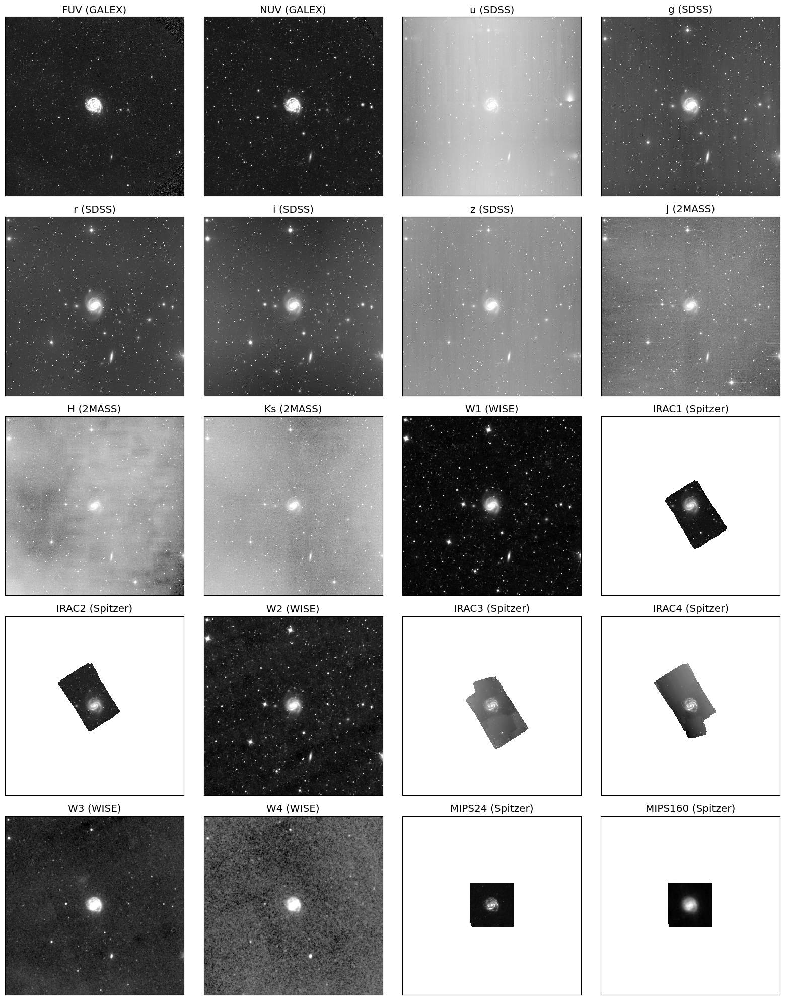

In [4]:
# We will plot the images in order of wavelength.
image_table.sort('wavelength_um')
sorted_bands = list(image_table['band'])

n_images = len(sorted_bands)
ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for ax, band in zip(axes, sorted_bands):
    data = images[band]

    # Percentile scaling helps us see faint structure without letting bright stars dominate.
    norm = ImageNormalize(
        data,
        interval=PercentileInterval(99.5),
        stretch=AsinhStretch()
    )

    ax.imshow(data, origin='lower', cmap='gray', norm=norm)
    ax.set_title(f'{band} ({image_table[image_table['band'] == band]['instrument'][0]})')
    ax.set_xticks([])
    ax.set_yticks([])

# Turn off any unused panels
for ax in axes[n_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

You can probably pretty clearly see that not only do we have images of different sizes (particularly the Spitzer data), but that there is significant background changes in many of the images! This can come from two primary sources: 
- Milky Way foreground dust extinction. Since we have to look through our own Galaxy to see other galaxies, we are always looking through the dust in our Galaxy. Thankfully, above and below the plane of the Galaxy, this isn't a huge effect. And even more thankfully, a lot of really smart people have mapped where the dust is in the sky and how much of it there is. 
- Sky brightness + observation effects. The sky, even though it appears dark, does have a brightness to it. The night sky has a surface brightness of about 21.8 mag/arcsec<sup>2</sup>. We've got to subtract out that sky brightness from our images. But there are also telescopic/observation effects. For instance, if you look at the IRAC4 image, you can clearly see a gradient from the right to the left. This is not likely a change in the night sky, per se, but rather something to do with the observations. Again, there are tools we can use to remove some of these strong background changes. 

## 4. Correcting for Foreground Milky Way Extinction

We'll start with the easier extinction caused by the Milky Way's dust. This dust absorbs and scatters light, making the observed flux too faint and too red. You've probably experienced this if you've ever tried to look at a light, like the Sun, through the smoke of a fire; the Sun will appear fainter and redder! This will have a larger effect on the bluer filters, the UV images especially. 

Unfortunately, the IRSA Dust Service which stores this data does not have calculations for the UV. We'll follow the method of [Decleir+19](https://scixplorer.org/abs/2019MNRAS.486..743D/abstract) who convolved the GALEX filters with an extinction curve of the Milky Way from [Cardelli+89](https://scixplorer.org/abs/1989ApJ...345..245C/abstract). They reported the extinction in $A_\lambda/A_V$, so we need to take a V-magnitude extinction and multiply it by this factor to get the extinction in the UV. Most other numbers are reported by the IRSA Dust Service, except for the mid- and far-infrared filters, which we'll just assume have zero extinction. 

The extinction in a particular band is usually written as $A_\lambda$ and measured in magnitudes. Since magnitudes are logarithmic, the correction is multiplicative: $$F_{\rm corrected} = F_{\rm observed} \times 10^{0.4 A_\lambda}.$$ We call this "subtracting off extinction", but the operation is not subtraction. We're undoing the dimming caused by dust. 



In [5]:
extinction_table = Table(
    names=['band', 'A_lambda_mag'],
    dtype=['U20', float]
)

for band in sorted_bands:
    extinction_table.add_row((band, np.nan))

# GALEX
extinction_table['A_lambda_mag'][extinction_table['band'] == 'FUV'] = 2.65 * 0.07
extinction_table['A_lambda_mag'][extinction_table['band'] == 'NUV'] = 2.63 * 0.07

# SDSS
extinction_table['A_lambda_mag'][extinction_table['band'] == 'u'] = 0.111
extinction_table['A_lambda_mag'][extinction_table['band'] == 'g'] = 0.086
extinction_table['A_lambda_mag'][extinction_table['band'] == 'r'] = 0.060
extinction_table['A_lambda_mag'][extinction_table['band'] == 'i'] = 0.044
extinction_table['A_lambda_mag'][extinction_table['band'] == 'z'] = 0.033

# 2MASS
extinction_table['A_lambda_mag'][extinction_table['band'] == 'J'] = 0.019
extinction_table['A_lambda_mag'][extinction_table['band'] == 'H'] = 0.012
extinction_table['A_lambda_mag'][extinction_table['band'] == 'Ks'] = 0.008

# Spitzer
extinction_table['A_lambda_mag'][extinction_table['band'] == 'IRAC1'] = 0.005
extinction_table['A_lambda_mag'][extinction_table['band'] == 'IRAC2'] = 0.004
extinction_table['A_lambda_mag'][extinction_table['band'] == 'IRAC3'] = 0.003
extinction_table['A_lambda_mag'][extinction_table['band'] == 'IRAC4'] = 0.003
extinction_table['A_lambda_mag'][extinction_table['band'] == 'MIPS24'] = 0.0
extinction_table['A_lambda_mag'][extinction_table['band'] == 'MIPS160'] = 0.0

# WISE
extinction_table['A_lambda_mag'][extinction_table['band'] == 'W1'] = 0.005
extinction_table['A_lambda_mag'][extinction_table['band'] == 'W2'] = 0.004
extinction_table['A_lambda_mag'][extinction_table['band'] == 'W3'] = 0.0
extinction_table['A_lambda_mag'][extinction_table['band'] == 'W4'] = 0.0




In [6]:
# We will store the extinction-corrected images here.
extcorr_images = {}

# We will also create a summary table recording the extinction used for each band. 
extcorr_summary = Table(
    names=['band', 'irsa_filter_name', 'A_lambda_mag', 'correction_factor'],
    dtype=['U20','U30',float,float]
)

for row in image_table:
    band = row['band']
    irsa_name = row['irsa_filter_name']

    # Find the matching row in the extinction table
    match = extinction_table[extinction_table['band'] == band]

    if len(match) == 0:
        print(f'WARNING: Could not find {band} in the extinction table.')
        print(f'         No extinction correction will be applied to {band}.')
        A_lambda = 0.0
    else:
        A_lambda = float(match['A_lambda_mag'][0])

    correction_factor = 10.0**(0.4 * A_lambda)

    extcorr_images[band] = images[band] * correction_factor

    extcorr_summary.add_row((band, irsa_name, A_lambda, correction_factor))

extcorr_summary

band,irsa_filter_name,A_lambda_mag,correction_factor
str20,str30,float64,float64
FUV,GALEX FUV,0.1855,1.186314940611619
NUV,GALEX NUV,0.1841,1.1847862354013075
u,SDSS u,0.111,1.1076434916697433
g,SDSS g,0.086,1.0824304476091304
r,SDSS r,0.06,1.0568175092136585
i,SDSS i,0.044,1.0413578615284345
z,SDSS z,0.033,1.030860740062626
J,2MASS J,0.019,1.0176536626205333
H,2MASS H,0.012,1.011113711954907


Inspecting the table above, you can see that the corrections are very small for NGC 4321. Most of the images weren't changed at all. 

## 5. Defining Galaxy Masks

Since our overarching goal is to remove the background in each image, we'll need to mask objects that are not sky. The most important object to mask is NGC 4321. If we don't mask the galaxy, the background model will think its light is part of the sky and it will skew the model. 

We also need to mask other nearby galaxies in the images. We'll define galaxy masks as circles on the image: 
- center RA in degrees
- center Dec in degrees
- circular radius in degrees

In [7]:
# Galaxy masks 
galaxy_masks = Table(
    names=['name','ra_deg','dec_deg','radius_deg'],
    dtype=['U40', float, float, float]
)

# Main galaxy: NGC 4321 / M100
galaxy_masks.add_row(('NGC4321', 185.728590, 15.821635, 270./3600.))
# NGC 4323
galaxy_masks.add_row(('NGC4323', 185.757050, 15.905498, 72./3600.))
# NGC 4328
galaxy_masks.add_row(('NGC4328', 185.833012, 15.820016, 72./3600.))
# VCC 636
galaxy_masks.add_row(('VCC636', 185.838067, 15.868924, 30./3600.))
# VCC 619
galaxy_masks.add_row(('VCC619', 185.771027, 15.931653, 30./3600.))
# IC 783A
galaxy_masks.add_row(('IC738A', 185.581697, 15.733575, 30./3600.))
# VCC 530
galaxy_masks.add_row(('VCC530', 185.531710, 15.799000, 30./3600.))
# UGC 7425
galaxy_masks.add_row(('UGC7425', 185.473689, 15.645846, 30./3600.))
# IC 783
galaxy_masks.add_row(('IC783', 185.411557, 15.745239, 55./3600.))
# NGC 4312
galaxy_masks.add_row(('NGC4312', 185.630221, 15.538208, 185./3600.))

galaxy_masks

name,ra_deg,dec_deg,radius_deg
str40,float64,float64,float64
NGC4321,185.72859,15.821635,0.075
NGC4323,185.75705,15.905498,0.02
NGC4328,185.833012,15.820016,0.02
VCC636,185.838067,15.868924,0.008333333333333333
VCC619,185.771027,15.931653,0.008333333333333333
IC738A,185.581697,15.733575,0.008333333333333333
VCC530,185.53171,15.799,0.008333333333333333
UGC7425,185.473689,15.645846,0.008333333333333333
IC783,185.411557,15.745239,0.015277777777777777


Since we're going to be using circular masks several times to mask galaxies, bright stars, and dim stars, we'll write a small helper function. 

In [8]:
def add_circular_sky_mask(mask, wcs, ra_deg, dec_deg, radius_deg):
    """
    Add a circular sky mask to an existing boolean mask.

    Parameters
    ----------
    mask : 2D boolean ndarray
        Existing mask. True means "masked".
    wcs : astropy.wcs.WCS
        Celestial WCS for the image.
    ra_deg, dec_deg : float
        Center of the circular mask in degrees.
    radius_deg : float
        Radius of the circular mask in degrees
    
    Returns
    -------
    mask : 2D boolean ndarray
        Updated mask with the circular region added.
    """

    # Convert the sky coordinates to pixel coordinates
    coord = SkyCoord(ra=ra_deg*u.deg, dec=dec_deg*u.deg, frame='icrs')
    x_center, y_center = wcs.world_to_pixel(coord)

    # Estimate the image pixel scale
    # This converts the angular radius from degrees to pixels
    pixscale_deg = np.mean(proj_plane_pixel_scales(wcs))
    radius_pix = radius_deg / pixscale_deg

    # If the object is far outside the image, we can skip it. 
    ny, nx = mask.shape
    if (x_center < -radius_pix or x_center > nx + radius_pix or
        y_center < -radius_pix or y_center > ny + radius_pix):
        return mask
    
    # Create arrays of pixel coordinates
    yy, xx = np.indices(mask.shape)

    # Circular distance from the object center in pixels
    rr = np.sqrt((xx - x_center)**2 + (yy - y_center)**2)

    # Add this circular region to the mask
    mask = mask | (rr <= radius_pix)

    return mask

## 6. Estimate the Image Footprint

To query the Tycho-2 and 2MASS catalogs, we'll need to know how much sky our images cover. Since these different surveys do not have the same image size, especially the Spitzer data, we'll estimate the maximum angular radius needed to cover all of the images and use that for our catalog queries. 

In [9]:
# Estimate the maximum sky radius covered by any image. 

max_radius_deg = 0.0

for band in sorted_bands:
    data = images[band]
    wcs = wcs_dict[band]

    ny, nx = data.shape

    # Pixel coordinates of the image corners. 
    corner_x = np.array([0, nx-1, 0, nx-1])
    corner_y = np.array([0, 0, ny-1, ny-1])

    # Convert corners to sky coordinates.
    corner_coords = wcs.pixel_to_world(corner_x, corner_y)

    # Find the largest separation from the target center to an image corner. 
    radius_deg = np.max(target_coord.separation(corner_coords).to(u.deg).value)

    max_radius_deg = max(max_radius_deg, radius_deg)

# Add a small buffer to sources near the edge are not missed
catalog_query_radius = 1.05 * max_radius_deg * u.deg

print(f'Estimated maximum image radius: {max_radius_deg:.3f} deg')
print(f'Catalog query radius with buffer: {catalog_query_radius:.3f}')

Estimated maximum image radius: 0.708 deg
Catalog query radius with buffer: 0.743 deg


## 7. Query Tycho-2 and 2MASS

We'll be using two catalogs for masking: 

### Tycho-2

The Tycho-2 Catalog [(Høg+00)](https://scixplorer.org/abs/2000A%26A...355L..27H/abstract) contains bright stars. We need to mask these stars because often they are so bright that they actually cause image errors as their light bounces around in the telescope. This can take the form of halos, diffraction spikes, and scattered light. 

### 2MASS All-Sky Catalog of Point Sources

2MASS (Two-Micron All-Sky Survey) goes much fainter than Tycho-2. We'll use the All-Sky Catalog of Point Sources [(Skrutskie+06)](https://scixplorer.org/abs/2006AJ....131.1163S/abstract) to mask foreground stars and background sources that are bright in the infrared. 

For background estimation, the 2MASS sources are generally too dim to screw with the background, so we'll only worry about the Tycho-2 stars. But for the final science images, we'll mask both 2MASS and Tycho-2 sources. 

In [34]:
# VizieR sometimes limits the number of rows downloaded. 
# Setting ROW_LIMIT = -1 asks for all rows that match the query. 
# Vizier.ROW_LIMIT = -1

# We request only the columns we need.
tycho_vizier = Vizier(
    columns=['RAmdeg','DEmdeg','BTmag','VTmag']
)
tycho_vizier.ROW_LIMIT = -1

twomass_vizier = Vizier(
    columns=['RAJ2000','DEJ2000','Jmag','Hmag','Kmag','Qflg']
)
twomass_vizier.ROW_LIMIT = -1

print('Querying Tycho-2...')
tycho_result = tycho_vizier.query_region(
    target_coord,
    radius=catalog_query_radius,
    catalog='I/259/tyc2'
)

if len(tycho_result) == 0:
    tycho_sources = Table(
        names=['RAmdeg','DEmdeg','BTmag'],
        dtype=[float, float, float]
    )
else:
    tycho_sources = tycho_result[0]

print(f'Found {len(tycho_sources)} Tycho-2 sources.')

print('Querying 2MASS All-Sky Catalog of Point Sources...')
twomass_result = twomass_vizier.query_region(
    target_coord,
    radius=catalog_query_radius,
    catalog='II/246/out'
)

if len(twomass_result) == 0:
    twomass_sources = Table(
        names=['RAJ2000','DEJ2000','Jmag','Hmag','Kmag','Qflg'],
        dtype=[float, float, float, float, float, 'U3']
    )
else:
    twomass_sources = twomass_result[0]

print(f'Found {len(twomass_sources)} 2MASS sources.')

Querying Tycho-2...
Found 31 Tycho-2 sources.
Querying 2MASS All-Sky Catalog of Point Sources...
Found 2304 2MASS sources.


## 8. Define Star Mask Radii

Bright stars need larger masks than faint stars. This is not because bright stars are physically bigger, but bright stars create larger artifacts on the images. The formula below is empirical; I was just trying stuff around. You should always inspect the masks if you're unsure. 

In [41]:
# Approximate image resolution for each band
# These come straight from Table 1 from Clarke+18. 
psf_fwhm_arcsec = {
    'FUV': 4.3,
    'NUV': 5.3,
    'u': 1.3,
    'g': 1.3,
    'r': 1.3,
    'i': 1.3,
    'z': 1.3,
    'J': 2.0,
    'H': 2.0,
    'Ks': 2.0,
    'IRAC1': 1.66,
    'IRAC2': 1.72,
    'IRAC3': 1.88,
    'IRAC4': 1.98,
    'MIPS24': 6,
    'MIPS70': 18,
    'MIPS160': 38,
    'W1': 6.1,
    'W2': 6.4,
    'W3': 6.5,
    'W4': 12
}

# Maximum faintness for 2MASS masking
# Increasing this number masks more faint sources, but also risks masking
# features inside or near the galaxy if the galaxy mask is too small
twomass_kmag_limit = 20.0

# Minimum quality requirement for 2MASS.
# Qflg contains three characters, one each for J,H,Ks
# A,B,C,D are detections of decreasing quality
allowed_2mass_quality_flags = ['A','B','C','D']

For the background model, we'll mask invalid pixels, the main galaxy and other galaxies in the image, and the bright Tycho-2 stars. 

In [12]:
background_masks = {}

for band in sorted_bands:
    data = extcorr_images[band]
    wcs = wcs_dict[band]

    # Star by masking invalid pixels
    mask = ~np.isfinite(data)

    # Mask NGC 4321 and any other galaxies
    for gal in galaxy_masks:
        mask = add_circular_sky_mask(
            mask=mask,
            wcs=wcs,
            ra_deg=gal['ra_deg'],
            dec_deg=gal['dec_deg'],
            radius_deg=gal['radius_deg']
        )
    
    # Mask Tycho-2 stars
    # For bright stars, the mask radius grows as stars get brighter
    for src in tycho_sources:
        ra = src['RAmdeg']
        dec = src['DEmdeg']

        # BTmag can be masked/missing in rare cases
        # If BTmag is missing, we'll use a standard bright star mask
        try:
            btmag = float(src['BTmag'])
        except Exception:
            btmag = 8.0
        
        if not np.isfinite(btmag):
            btmag = 8.0

        # Bright stars get large masks
        radius_arcsec = 150.0 * 10**(-0.2 * (btmag - 8.0))

        # Do not allow the mask to become absurdly small or large
        radius_arcsec = np.clip(radius_arcsec, 15.0, 300.0)

        # Also make sure the mask is at least several PSF FWHM
        radius_arcsec = max(radius_arcsec, 4.0 * psf_fwhm_arcsec.get(band, 3.0))

        mask = add_circular_sky_mask(
            mask=mask,
            wcs=wcs,
            ra_deg=ra,
            dec_deg=dec,
            radius_deg=(radius_arcsec / 3600.)
        )

    background_masks[band] = mask

print('Created background masks.')

Created background masks.


## 9. Inspect the Background Mask

It is always important to inspect masks by eye! In the plot below, the grayscale image is the extinction-corrected image and the colored overlay shows the masked pixels. 

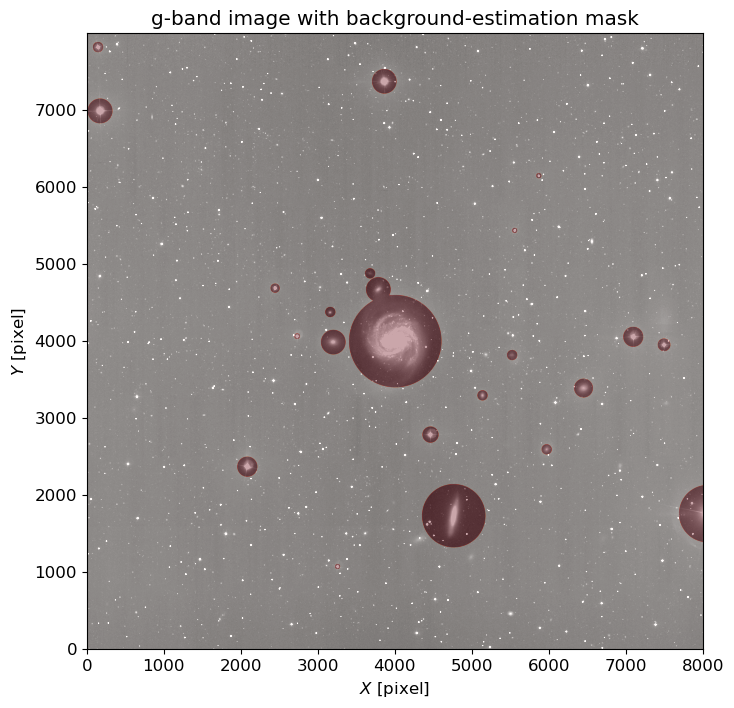

In [40]:
# Choose one band to inspect
inspect_band = 'g'

data = extcorr_images[inspect_band]
mask = background_masks[inspect_band]

norm = ImageNormalize(
    data,
    interval=PercentileInterval(99.5),
    stretch=AsinhStretch()
)

plt.figure(figsize=(8,8))
plt.imshow(data, origin='lower', cmap='gray', norm=norm)
plt.imshow(mask, origin='lower', cmap='Reds', alpha=0.35)
plt.title(f'{inspect_band}-band image with background-estimation mask')
plt.xlabel(r'$X$ [pixel]')
plt.ylabel(r'$Y$ [pixel]')
plt.show()

## 10. Estimate and Subtract the Background

Now, after all that, we can finally subtract the background! We'll use `Background2D` from Photutils. 

The main parameters are: 
- `box_size`: size of the mesh boxes used to estimate the local background. 
- `filter_size`: size of the median filter applied to the low-resolution background grid.
- `sigma_clip`: rejects outlier pixels in each box.
- `bkg_estimator`: the statistic used to estimate the background in each box.
- `bkg_rms_estimator`: the statistic used to estimate the background RMS in each box. 

The right `box_size` depends on the image. A good background box should usually be much larger than stars, larger than small-scale structure, but small enough to follow large-scale background variations. 

In [72]:
# Background2D settings
box_size_by_hand = {
    'FUV': 64,
    'NUV': 64,
    'u': 128,
    'g': 128,
    'r': 128,
    'i': 128,
    'z': 128,
    'J': 64,
    'H': 64,
    'Ks': 64,
    'IRAC1': 64,
    'IRAC2': 64,
    'IRAC3': 64,
    'IRAC4': 64,
    'MIPS24': 32,
    'MIPS70': 32,
    'MIPS160': 16,
    'W1': 32,
    'W2': 32,
    'W3': 32,
    'W4': 32
}

# Sigma clipping removes extreme values while estimating the background in each mesh.
sigma_clip = SigmaClip(sigma=3.0, maxiters=10)

# Median background is robust against outliers
bkg_estimator = MedianBackground()

# MADStdBackgroundRMS is a robust estimate of the background noise
bkg_rms_estimator = MADStdBackgroundRMS()

background_models = {}
background_rms_models = {}
background_subtracted_images = {}

for band in sorted_bands:
    print(f'Estimating background for {band}')

    data = extcorr_images[band]
    mask = background_masks[band]

    box_size = box_size_by_hand.get(band, 64)

    # The coverage mask tells Background2D which pixels have no real data
    # This is different from source masking. Here we'll use non-finite pixels.
    coverage_mask = ~np.isfinite(data)

    bkg = Background2D(
        data,
        box_size=box_size,
        mask=mask,
        coverage_mask=coverage_mask,
        filter_size=(11,11),
        sigma_clip=sigma_clip,
        bkg_estimator=bkg_estimator,
        bkg_rms_estimator=bkg_rms_estimator,
        exclude_percentile=10.0
    )

    background = bkg.background
    background_rms = bkg.background_rms

    background_models[band] = background
    background_rms_models[band] = background_rms
    background_subtracted_images[band] = data - background

print('Done.')

Estimating background for FUV
Estimating background for NUV
Estimating background for u
Estimating background for g
Estimating background for r
Estimating background for i
Estimating background for z
Estimating background for J
Estimating background for H
Estimating background for Ks
Estimating background for W1
Estimating background for IRAC1
Estimating background for IRAC2
Estimating background for W2
Estimating background for IRAC3
Estimating background for IRAC4
Estimating background for W3
Estimating background for W4
Estimating background for MIPS24
Estimating background for MIPS160
Done.


Now let's take a look at these background models. They should vary smoothly across the image. 

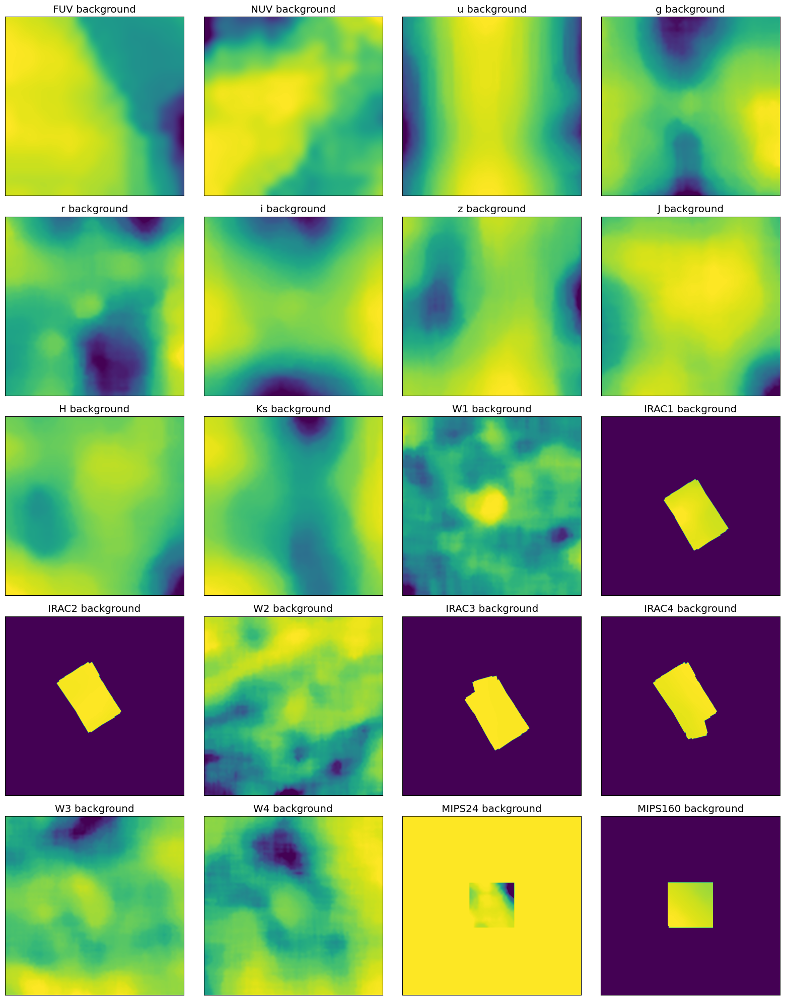

In [73]:
n_images = len(sorted_bands)
ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for ax, band in zip(axes, sorted_bands):
    bkg = background_models[band]

    norm = ImageNormalize(
        bkg,
        interval=PercentileInterval(99.5),
        stretch=AsinhStretch()
    )

    im = ax.imshow(bkg, origin='lower', cmap='viridis', norm=norm)
    ax.set_title(f'{band} background')
    ax.set_xticks([])
    ax.set_yticks([])

for ax in axes[n_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Now that we've got our background models, let's also plot the background-subtracted images. If you compare these images to the images we plotted all the way back at the beginning, hopefully these have a relatively flat background sky. 

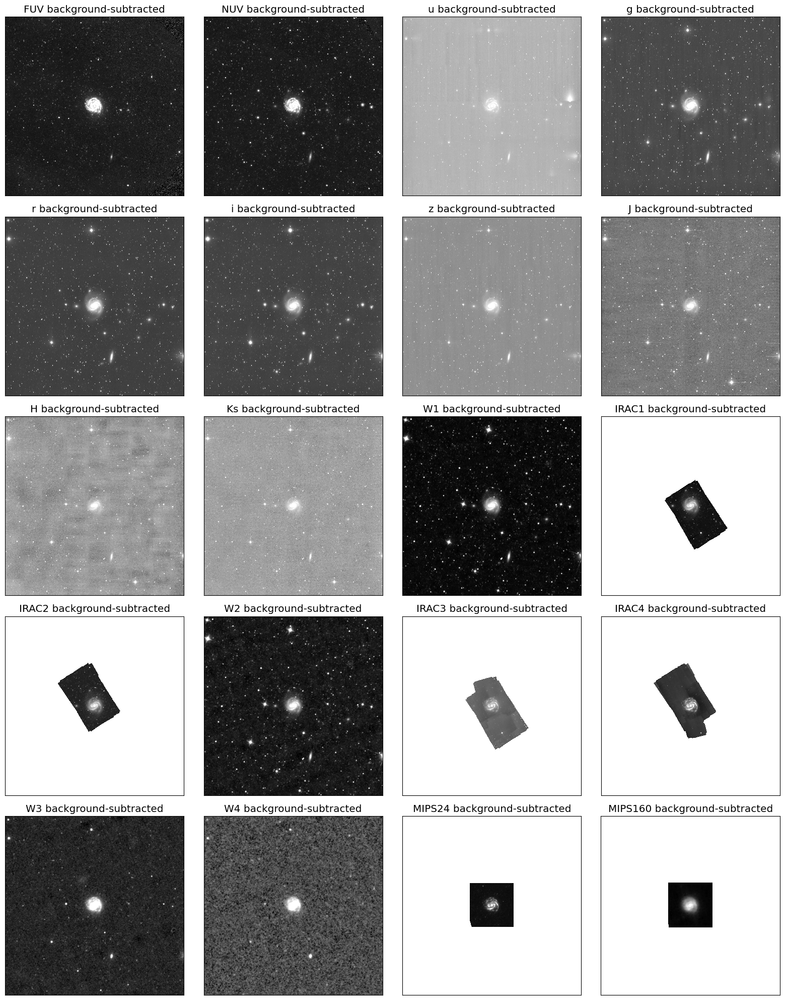

In [74]:
n_images = len(sorted_bands)
ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for ax, band in zip(axes, sorted_bands):
    bkg = background_subtracted_images[band]

    norm = ImageNormalize(
        bkg,
        interval=PercentileInterval(99.5),
        stretch=AsinhStretch()
    )

    im = ax.imshow(bkg, origin='lower', cmap='gray', norm=norm)
    ax.set_title(f'{band} background-subtracted')
    ax.set_xticks([])
    ax.set_yticks([])

for ax in axes[n_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

## 11. Create Uncertainty Images

Each final science image should have an associated uncertainty image. We'll include two sources of uncertainty: 
1. **Background uncertainty**
    This comes from the local background RMS estimated by `Background2D`.

2. **Calibratino uncertainty**
    DustPedia reports a calibration uncertainty for each band as a percentage. This is a multiplicative factor that scales with the measured flux. 

For each pixel, we combine these two terms in quadrature: $$\sigma_{\rm total} = \sqrt{\sigma_{\rm bkg}^2 + \sigma_{\rm cal}^2}.$$ The calibration term is $$\sigma_{\rm cal} = f_{\rm cal}|I|,$$ where $f_{\rm cal}$ is the fractional calibration uncertainty and $|I|$ is the background-subtracted image. For example, a 1.3% calibration uncertainty corresponds to $f_{\rm cal} = 0.013$. 

In [51]:
# Create a calibration table that records the uncertainty as a percentage for each band.

calibration_table = Table(
    names=['band', 'calibration_percent'],
    dtype=['U20', float]
)

for band in sorted_bands:
    calibration_table.add_row((band, np.nan))

calibration_table['calibration_percent'][calibration_table['band'] == 'FUV'] = 4.5
calibration_table['calibration_percent'][calibration_table['band'] == 'NUV'] = 2.7
calibration_table['calibration_percent'][calibration_table['band'] == 'u'] = 1.3
calibration_table['calibration_percent'][calibration_table['band'] == 'g'] = 0.8
calibration_table['calibration_percent'][calibration_table['band'] == 'r'] = 0.8
calibration_table['calibration_percent'][calibration_table['band'] == 'i'] = 0.7
calibration_table['calibration_percent'][calibration_table['band'] == 'z'] = 0.8
calibration_table['calibration_percent'][calibration_table['band'] == 'J'] = 1.7
calibration_table['calibration_percent'][calibration_table['band'] == 'H'] = 1.9
calibration_table['calibration_percent'][calibration_table['band'] == 'Ks'] = 1.9
calibration_table['calibration_percent'][calibration_table['band'] == 'IRAC1'] = 3.0
calibration_table['calibration_percent'][calibration_table['band'] == 'IRAC2'] = 3.0
calibration_table['calibration_percent'][calibration_table['band'] == 'IRAC3'] = 3.0
calibration_table['calibration_percent'][calibration_table['band'] == 'IRAC4'] = 3.0
calibration_table['calibration_percent'][calibration_table['band'] == 'MIPS24'] = 5.0
calibration_table['calibration_percent'][calibration_table['band'] == 'MIPS160'] = 12.0
calibration_table['calibration_percent'][calibration_table['band'] == 'W1'] = 2.9
calibration_table['calibration_percent'][calibration_table['band'] == 'W2'] = 3.4
calibration_table['calibration_percent'][calibration_table['band'] == 'W3'] = 4.6
calibration_table['calibration_percent'][calibration_table['band'] == 'W4'] = 5.6

calibration_table

band,calibration_percent
str20,float64
FUV,4.5
NUV,2.7
u,1.3
g,0.8
r,0.8
i,0.7
z,0.8
J,1.7
H,1.9


In [52]:
# These dictionaries will store the separate and combined uncertainty images.
background_uncertainty_images = {}
calibration_uncertainty_images = {}
total_uncertainty_images = {}

for band in sorted_bands:
    print(f'Creating uncertainty image for {band}')

    # This is the extinction-corrected, background-subtracted science image.
    science_image = background_subtracted_images[band]

    # This is is the local background RMS estimated by Background2D
    #
    # Interpretation:
    # This is a per-pixel random uncertainty associated with the local sky.
    # It includes the scatter of the unmasked background pixels
    sigma_bkg = background_rms_models[band]

    # Get the calibration uncertainty for this band
    cal_percent = calibration_table[
        calibration_table['band'] == band
    ]['calibration_percent'][0]

    # Convert percent to fraction
    cal_fraction = cal_percent / 100.0

    # Calibration uncertainty scales with flux
    # 
    # We use absolute value so that the uncertainty is positive
    sigma_cal = cal_fraction * np.abs(science_image)

    # Combine the background and calibration uncertainties in quadrature
    sigma_total = np.sqrt(sigma_bkg**2 + sigma_cal**2)

    # Save products in dictionaries
    background_uncertainty_images[band] = sigma_bkg
    calibration_uncertainty_images[band] = sigma_cal
    total_uncertainty_images[band] = sigma_total

print('Done creating uncertainty images.')

Creating uncertainty image for FUV
Creating uncertainty image for NUV
Creating uncertainty image for u
Creating uncertainty image for g
Creating uncertainty image for r
Creating uncertainty image for i
Creating uncertainty image for z
Creating uncertainty image for J
Creating uncertainty image for H
Creating uncertainty image for Ks
Creating uncertainty image for W1
Creating uncertainty image for IRAC1
Creating uncertainty image for IRAC2
Creating uncertainty image for W2
Creating uncertainty image for IRAC3
Creating uncertainty image for IRAC4
Creating uncertainty image for W3
Creating uncertainty image for W4
Creating uncertainty image for MIPS24
Creating uncertainty image for MIPS160
Done creating uncertainty images.


As always, we should inspect the images we just made. The uncertainty should usually be larger near the bright sources (since the calibration uncertainty scales with flux) and in regions with higher background residuals.

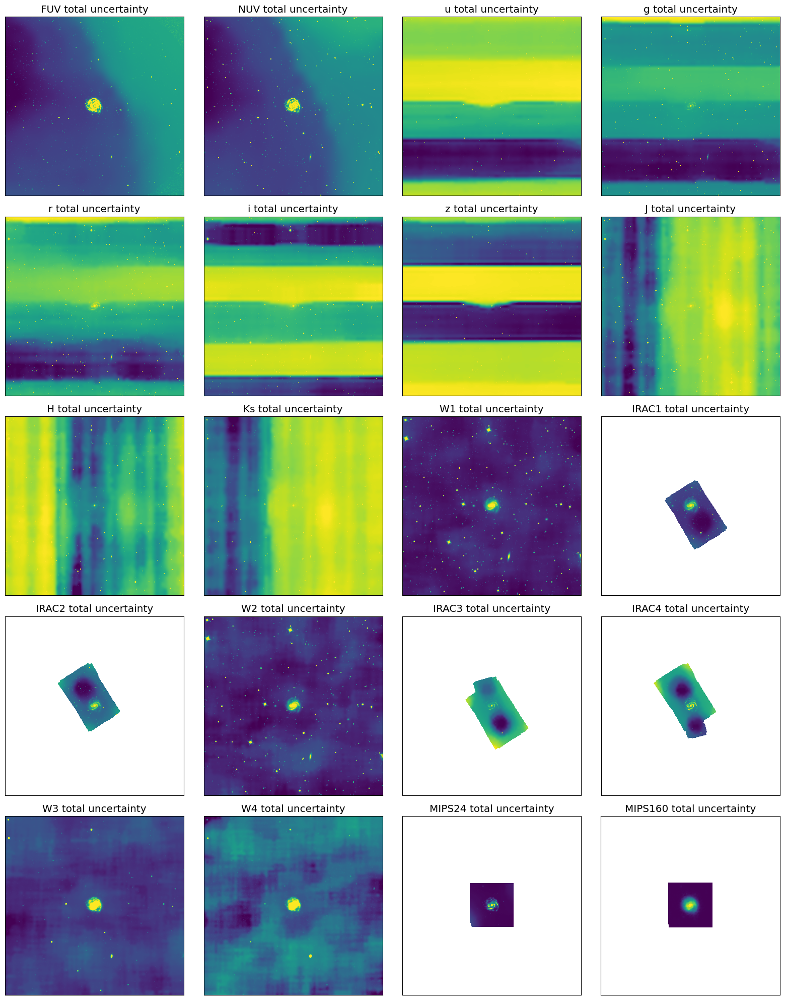

In [54]:
n_images = len(sorted_bands)
ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for ax, band in zip(axes, sorted_bands):
    sigma = total_uncertainty_images[band]

    norm = ImageNormalize(
        sigma,
        interval=PercentileInterval(99.5),
        stretch=AsinhStretch()
    )

    im = ax.imshow(sigma, origin='lower', cmap='viridis', norm=norm)
    ax.set_title(f'{band} total uncertainty')
    ax.set_xticks([])
    ax.set_yticks([])

for ax in axes[n_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

Another way of looking at how strong the uncertainties are is by looking at the "signal-to-noise" (S/N). This is simply the data divided by the uncertainty. 

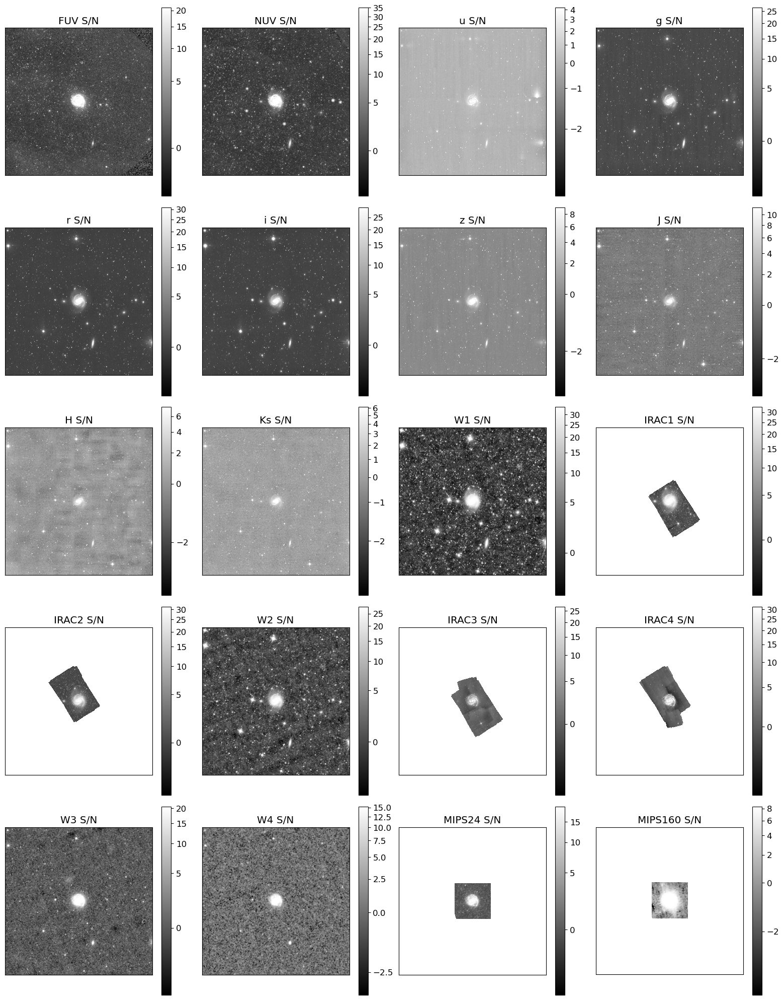

In [77]:
n_images = len(sorted_bands)
ncols = 4
nrows = int(np.ceil(n_images / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for ax, band in zip(axes, sorted_bands):
    data = background_subtracted_images[band]
    sigma = total_uncertainty_images[band]

    norm = ImageNormalize(
        data/sigma,
        interval=PercentileInterval(99.5),
        stretch=AsinhStretch()
    )

    im = ax.imshow(data/sigma, origin='lower', cmap='gray', norm=norm)
    plt.colorbar(im, ax=ax)
    ax.set_title(f'{band} S/N')
    ax.set_xticks([])
    ax.set_yticks([])

for ax in axes[n_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

As we can see, the images with the worst quality are the SDSS u-band, SDSS z-band, 2MASS H-band, and 2MASS Ks-band, since these images had a very strong and variable background to begin with. The data is better, but we'll still have to keep this in mind going forward. 

## 12. Save the Final Images

For each band, we'll save a multi-extension FITS file containing: 
1. the final background-subtracted image,
2. the uncertainty image,
3. the background model,
4. the background RMS model

This is more useful than only saving the final image because we can diagnose problems later without having to re-do this analysis. 

In [78]:
for row in image_table:
    band = row['band']
    instrument = row['instrument']

    final_data = background_subtracted_images[band]
    background = background_models[band]
    background_rms = background_rms_models[band]
    sigma_bkg = background_uncertainty_images[band]
    sigma_cal = calibration_uncertainty_images[band]
    sigma_total = total_uncertainty_images[band]

    # Get calibration information for this band
    cal_percent = calibration_table[
        calibration_table['band'] == band
    ]['calibration_percent'][0]

    # Start from the original header so that WCS and units are preserved
    header = headers[band].copy()

    # Add processing history to the header
    ext_row = extcorr_summary[extcorr_summary['band'] == band][0]
    header['MWEXTCOR'] = (True, 'Corrected for foreground Milky Way extinction')
    header['ALAMBDA'] = (float(ext_row['A_lambda_mag']), 'Foreground extinction used [mag]')
    header['EXTFAC'] = (float(ext_row['correction_factor']), 'Multiplicative extinction correction')
    header['BACKSUB'] = (True, '2D background model subtracted')
    header['CALPCT'] = (float(cal_percent), 'DustPedia calibration uncertainty [percent]')

    primary_hdu = fits.PrimaryHDU(data=final_data, header=header)

    bkg_hdu = fits.ImageHDU(data=background, name='BACKGROUND')
    bkg_rms_hdu = fits.ImageHDU(data=background_rms, name='BACKGROUND_RMS')
    sigma_bkg_hdu = fits.ImageHDU(data=sigma_bkg, name='SIGMA_BKG')
    sigma_cal_hdu = fits.ImageHDU(data=sigma_cal, name='SIGMA_CAL')
    sigma_total_hdu = fits.ImageHDU(data=sigma_total, name='SIGMA_TOTAL')

    hdul = fits.HDUList([primary_hdu, bkg_hdu, bkg_rms_hdu, sigma_bkg_hdu, sigma_cal_hdu, sigma_total_hdu])

    output_filename = output_dir / f'NGC4321_{instrument}_{band}_bkgsub.fits'
    hdul.writeto(output_filename, overwrite=True)

    print(f'Saved {output_filename}')

Saved NGC4321_BkgSub/NGC4321_GALEX_FUV_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_GALEX_NUV_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_SDSS_u_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_SDSS_g_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_SDSS_r_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_SDSS_i_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_SDSS_z_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_2MASS_J_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_2MASS_H_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_2MASS_Ks_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_WISE_W1_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_IRAC1_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_IRAC2_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_WISE_W2_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_IRAC3_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_IRAC4_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_WISE_W3_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_WISE_W4_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_MIPS24_bkgsub.fits
Saved NGC4321_BkgSub/NGC4321_Spitzer_M

## 13. Save Summary Tables

Finally, we save a few small tables describing the processing. These are useful because they record which extinction correction was applied, which images were processed, and whi

In [80]:
extcorr_summary.write(output_dir / 'exctinction_corrections.ecsv', format='ascii.ecsv', overwrite=True)
image_table.write(output_dir / 'image_table.ecsv', format='ascii.ecsv', overwrite=True)
galaxy_masks.write(output_dir / 'galaxy_masks.ecsv', format='ascii.ecsv', overwrite=True)
calibration_table.write(output_dir / 'calibration_uncertainties.ecsv', format='ascii.ecsv', overwrite=True)